In [1]:
import pandas as pd
import torch
from transformers import AutoImageProcessor, EfficientNetModel, ViTModel, AutoModel, CLIPProcessor, CLIPModel, Blip2Processor, Blip2Model
from torchvision import models, transforms
import numpy as np
import os
import re
from tqdm.auto import tqdm
from PIL import Image


In [13]:
IMAGE_DIR = "images"
def load_local_image(file_path):
    # Sanitize the country name to match the local image file naming convention
    # sanitized_country_name = country_name.replace(" ", "_").replace("[", "").replace("]", "")
    
    # Path to the local image file
    image_path = os.path.join(IMAGE_DIR, file_path)

    # Check if the image exists in the folder
    if os.path.exists(image_path):
        img = Image.open(image_path)
        
        # Convert image to RGB if not already in that mode
        if img.mode != 'RGB':
            img = img.convert('RGB')
        
        return img
    else:
        print(f"Image for {file_path} not found.")
        return None

In [14]:
#ViT

def extract_features_vit(file_path):
    image_processor = AutoImageProcessor.from_pretrained("google/vit-large-patch16-224-in21k")
    model = ViTModel.from_pretrained("google/vit-large-patch16-224-in21k")
    
    # prepare input image
    img = load_local_image(file_path)
    inputs = image_processor(img, return_tensors='pt')
    
    with torch.no_grad():
        outputs = model(**inputs)
    embedding = outputs.last_hidden_state
    embedding = embedding[:, 0, :].squeeze(1)
    return embedding.numpy()

In [15]:
#EfficientNet

def extract_features_efficientNet(file_path):
    # load pre-trained image processor for efficientnet-b7 and model weight
    image_processor = AutoImageProcessor.from_pretrained("google/efficientnet-b7")
    model = EfficientNetModel.from_pretrained("google/efficientnet-b7")
 
    # prepare input image
    img = load_local_image(file_path)
    inputs = image_processor(img, return_tensors='pt')
    
    with torch.no_grad():
        outputs = model(**inputs, output_hidden_states=True)
    
    embedding = outputs.hidden_states[-1]
    embedding = torch.mean(embedding, dim=[2,3])
    return embedding.numpy()

In [16]:
#DINO-v2

def extract_features_DINO_v2(file_path):
    # load pre-trained image processor for efficientnet-b7 and model weight
    image_processor = AutoImageProcessor.from_pretrained('facebook/dinov2-base')
    model = AutoModel.from_pretrained('facebook/dinov2-base')
    
    # prepare input image
    img = load_local_image(file_path)
    inputs = image_processor(img, return_tensors='pt')
    
    with torch.no_grad():
        outputs = model(**inputs)
    embedding = outputs.last_hidden_state
    embedding = embedding[:, 0, :].squeeze(1)
    return embedding.numpy()

In [17]:
#CLIP

def extract_features_clip(file_path):
    # load pre-trained image processor for efficientnet-b7 and model weight
    image_processor = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32")
    model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")

    # prepare input image
    img = load_local_image(file_path)
    inputs = image_processor(images=img, return_tensors='pt', padding=True)
    
    with torch.no_grad():
        embedding = model.get_image_features(**inputs) 
    return embedding.numpy()

In [18]:
#Blip 2

def extract_features_blip(file_path):
    image_processor = Blip2Processor.from_pretrained("Salesforce/blip2-opt-2.7b")
    model = Blip2Model.from_pretrained("Salesforce/blip2-opt-2.7b", torch_dtype=torch.float16)
    img = load_local_image(file_path)
    inputs = image_processor(images=img, return_tensors='pt', padding=True)
    print('input shape: ', inputs['pixel_values'].shape)
    
    with torch.no_grad():
        outputs = model.get_qformer_features(**inputs)
    embedding = outputs.last_hidden_state
    embedding = embedding[:, 0, :].squeeze(1)
    return embedding.numpy()

In [19]:
#vgg16

def extract_features_vgg16(file_path):
    model = models.vgg16(pretrained=True) 
    model.eval()  # Set the model to evaluation mode

    # Define the transformation to preprocess the image
    preprocess = transforms.Compose([
        transforms.Resize(256),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])
    img = load_local_image(file_path)
    img_t = preprocess(img)
    batch_t = torch.unsqueeze(img_t, 0)

    with torch.no_grad():
        embedding = model(batch_t)
    return embedding.numpy()
    

In [20]:
files = os.listdir(IMAGE_DIR)

In [22]:
embeddings_list_vit = []

for index, file in tqdm(enumerate(files)):

    if '.DS_Store' in file or '.avif' in file:
        continue
    vectors = extract_features_vit(file)
    df = {
        'file_name' : file,
        'vectors' : vectors,
        'index' : index
    }
    embeddings_list_vit.append(df)


0it [00:00, ?it/s]

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
Fast image processor class <class 'transformers.models.vit.image_processing_

In [24]:
embeddings_list_efficientNet = []

for index, file in tqdm(enumerate(files)):

    if '.DS_Store' in file or '.avif' in file:
        continue
    vectors = extract_features_efficientNet(file)
    df = {
        'file_name' : file,
        'vectors' : vectors,
        'index' : index
    }
    embeddings_list_efficientNet.append(df)


0it [00:00, ?it/s]

pytorch_model.bin:  47%|####7     | 126M/267M [00:00<?, ?B/s]

In [25]:
embeddings_list_dino = []

for index, file in tqdm(enumerate(files)):

    if '.DS_Store' in file or '.avif' in file:
        continue
    vectors = extract_features_DINO_v2(file)
    df = {
        'file_name' : file,
        'vectors' : vectors,
        'index' : index
    }
    embeddings_list_dino.append(df)


0it [00:00, ?it/s]

preprocessor_config.json:   0%|          | 0.00/436 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/346M [00:00<?, ?B/s]

In [26]:
embeddings_list_clip = []

for index, file in tqdm(enumerate(files)):

    if '.DS_Store' in file or '.avif' in file:
        continue
    vectors = extract_features_clip(file)
    df = {
        'file_name' : file,
        'vectors' : vectors,
        'index' : index
    }
    embeddings_list_clip.append(df)


0it [00:00, ?it/s]

In [27]:
embeddings_list_blip = []

for index, file in tqdm(enumerate(files)):

    if '.DS_Store' in file or '.avif' in file:
        continue
    vectors = extract_features_blip(file)
    df = {
        'file_name' : file,
        'vectors' : vectors,
        'index' : index
    }
    embeddings_list_blip.append(df)


0it [00:00, ?it/s]

preprocessor_config.json:   0%|          | 0.00/432 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/882 [00:00<?, ?B/s]

vocab.json:   0%|          | 0.00/798k [00:00<?, ?B/s]

merges.txt:   0%|          | 0.00/456k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/3.56M [00:00<?, ?B/s]

added_tokens.json:   0%|          | 0.00/23.0 [00:00<?, ?B/s]

special_tokens_map.json:   0%|          | 0.00/548 [00:00<?, ?B/s]

processor_config.json:   0%|          | 0.00/68.0 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


In [28]:
embeddings_list_vgg = []

for index, file in tqdm(enumerate(files)):

    if '.DS_Store' in file or '.avif' in file:
        continue
    vectors = extract_features_vgg16(file)
    df = {
        'file_name' : file,
        'vectors' : vectors,
        'index' : index
    }
    embeddings_list_vgg.append(df)


0it [00:00, ?it/s]

/Users/ravitiwari/Projects/openai/env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/ravitiwari/Projects/openai/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /Users/ravitiwari/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:21<00:00, 26.0MB/s]


In [32]:
import numpy as np

def cosine_similarity(vec1, vec2):
    """
    Calculate the cosine similarity between two vectors.
    """
    vec1 = np.array(vec1).flatten()
    vec2 = np.array(vec2).flatten()
    
    # Calculate the dot product
    dot_product = np.dot(vec1, vec2)
    
    # Calculate the L2 norm (magnitude) of both vectors
    norm_vec1 = np.linalg.norm(vec1)
    norm_vec2 = np.linalg.norm(vec2)
    
    # Avoid division by zero
    if norm_vec1 == 0 or norm_vec2 == 0:
        return 0.0
    
    # Calculate cosine similarity
    return dot_product / (norm_vec1 * norm_vec2)

def sort_dicts_by_similarity(test_vector, dict_list):
    """
    Sort a list of dictionaries based on cosine similarity to the test vector.
    
    Parameters:
        test_vector (list or np.array): The test vector to compare against.
        dict_list (list of dict): List of dictionaries, each containing 'file_name', 'vectors', and 'index'.
    
    Returns:
        list: Sorted list of dictionaries based on cosine similarity (ascending order).
    """
    # Add cosine similarity to each dict
    for entry in dict_list:
        entry['cosine_similarity'] = cosine_similarity(test_vector, entry['vectors'])
    
    # Sort the list of dicts based on the 'cosine_similarity' key (ascending order)
    sorted_dict_list = sorted(dict_list, key=lambda x: x['cosine_similarity'])
    
    return sorted_dict_list




In [33]:
IMAGE_DIR = "/Users/ravitiwari/Downloads"
test_vector_1_vit = extract_features_vit("/Users/ravitiwari/Downloads/08146106800-e1.jpg")
test_vector_1_vgg = extract_features_vgg16("/Users/ravitiwari/Downloads/08146106800-e1.jpg")
test_vector_1_efficientNet = extract_features_efficientNet("/Users/ravitiwari/Downloads/08146106800-e1.jpg")
test_vector_1_dino = extract_features_DINO_v2("/Users/ravitiwari/Downloads/08146106800-e1.jpg")
test_vector_1_clip = extract_features_clip("/Users/ravitiwari/Downloads/08146106800-e1.jpg")
test_vector_1_blip = extract_features_blip("/Users/ravitiwari/Downloads/08146106800-e1.jpg")

Fast image processor class <class 'transformers.models.vit.image_processing_vit_fast.ViTImageProcessorFast'> is available for this model. Using slow image processor class. To use the fast image processor class set `use_fast=True`.
/Users/ravitiwari/Projects/openai/env/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/ravitiwari/Projects/openai/env/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

input shape:  torch.Size([1, 3, 224, 224])


In [3]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# =================== QUERY Image ================

Query Image


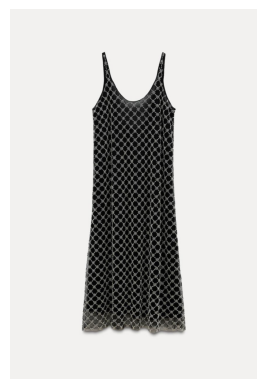

In [4]:
print("=="*50)
print("Query Image")
img = mpimg.imread("/Users/ravitiwari/Downloads/08146106800-e1.jpg")

# Display the image
plt.imshow(img)
plt.axis('off')  # Optional: to hide axes
plt.show()
print("=="*50)

# ============ Results Image ===============

shopping (2).webp
16
0.020004392


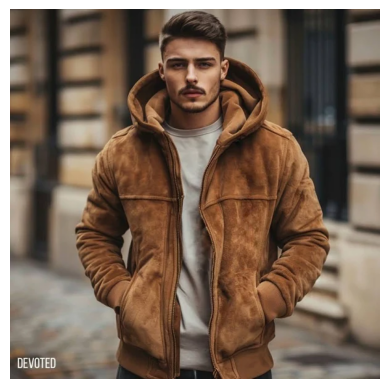

****************************************************************************************************
6ec116ad3d91468495c7b05208603c83_w1440_q90.webp
7
0.05852485


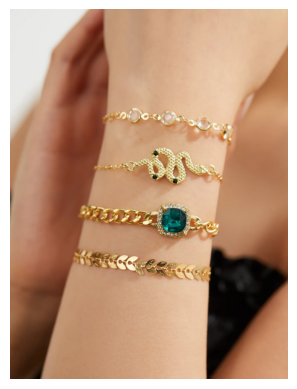

****************************************************************************************************
8d7e05fe131b43169c7ca0301e9cde4c_w1440_q90.webp
15
0.09596116


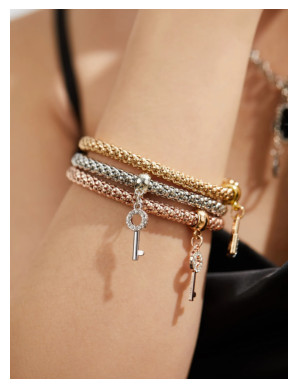

****************************************************************************************************
shopping.webp
5
0.10715865


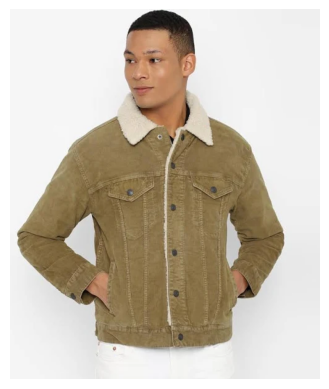

****************************************************************************************************
shopping (1).webp
13
0.109824


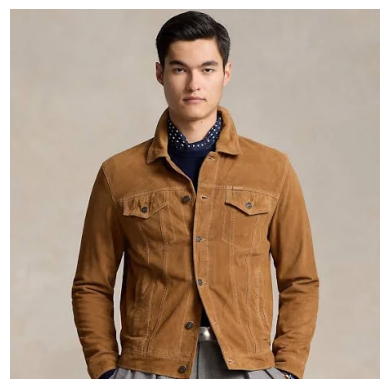

****************************************************************************************************
9ccaff8516b54973977bcfae15b1f4f1_w1440_q90.webp
6
0.12589468


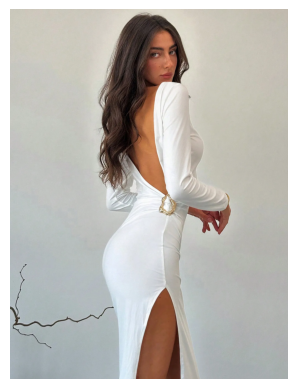

****************************************************************************************************
63c6aed159b640999e5f5ca02f451535_w1440_q90.webp
2
0.18623084


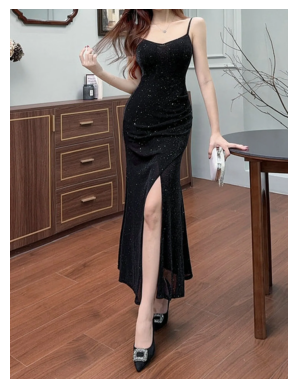

****************************************************************************************************
2f96f48099574d2ba127ad0853a7a7aa_w1440_q90.webp
1
0.21861754


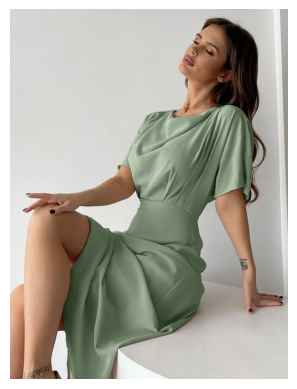

****************************************************************************************************
4d5c2747e06f4dd1b16ef4aa2eddf74f_w1440_q90.webp
12
0.23263821


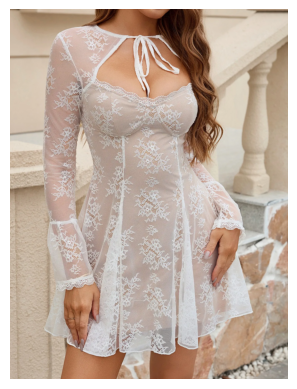

****************************************************************************************************
25ab40e0b8ac4b768fbbe84685a70902_w1440_q90.webp
17
0.24110036


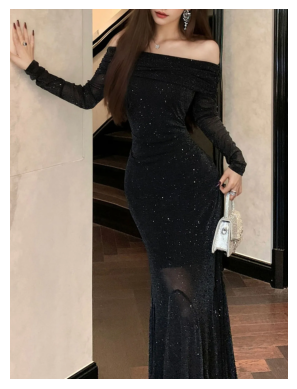

****************************************************************************************************
40c932fed45542348a75065820e76eca_w1440_q90.webp
9
0.2771228


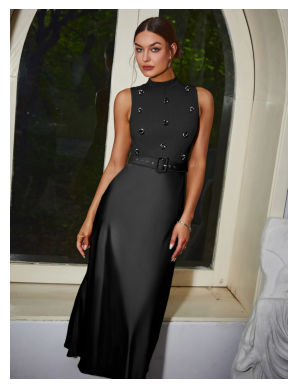

****************************************************************************************************
93c4eab1c0ff444eb0f26232cf563207_w1440_q90.webp
8
0.27736998


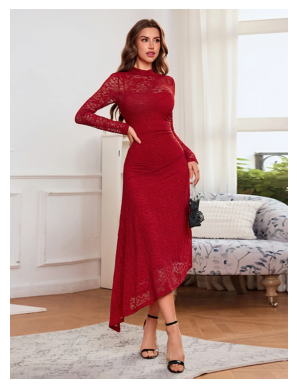

****************************************************************************************************
4f32c371ef744250af52302e340cf9ab_w1440_q90.webp
10
0.28369546


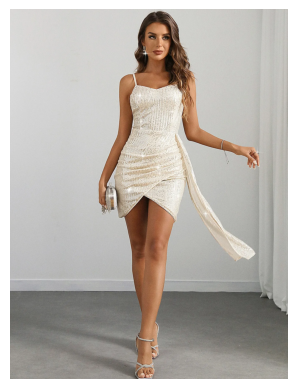

****************************************************************************************************
7f152440b3f14094863062e6496fffdb_w1440_q90.webp
4
0.2952475


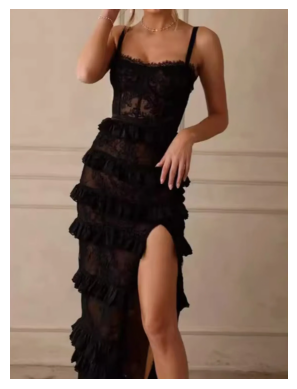

****************************************************************************************************
3e3172a74ebd4d43a4a4337bd7dff735UR_w1440_q90.webp
18
0.30014902


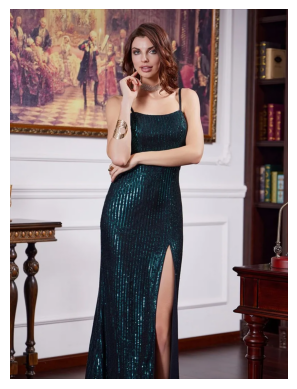

****************************************************************************************************
059d91c409724762849231cd96741114_w1440_q90.webp
0
0.31766903


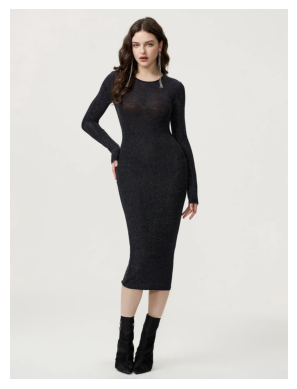

****************************************************************************************************
8fe7ed23a91b41608a8d79353cb9f7f6_w1440_q90.webp
14
0.38993612


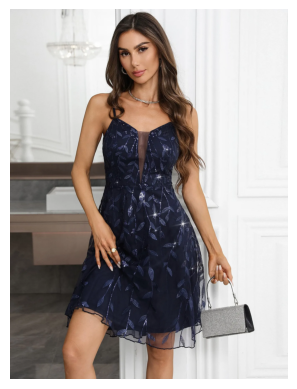

****************************************************************************************************


In [42]:
rt = sort_dicts_by_similarity(test_vector_1_vit, embeddings_list_vit)

for item in rt:
    print("=="*50)
    print(item['file_name'])
    print(item['index'])
    print(item['cosine_similarity'])
    img = mpimg.imread(os.path.join('images', item['file_name']))

    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Optional: to hide axes
    plt.show()
    print("**"*50)

8d7e05fe131b43169c7ca0301e9cde4c_w1440_q90.webp
15
0.4905


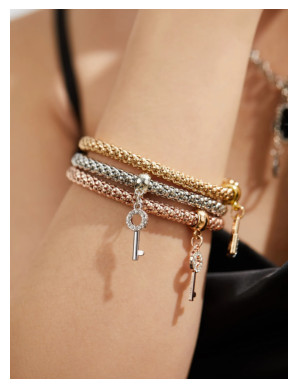

****************************************************************************************************
6ec116ad3d91468495c7b05208603c83_w1440_q90.webp
7
0.5107


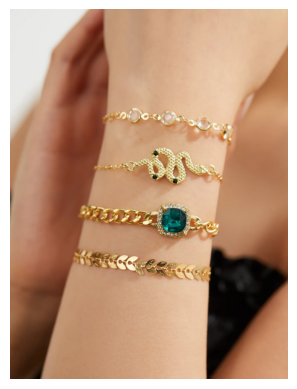

****************************************************************************************************
3e3172a74ebd4d43a4a4337bd7dff735UR_w1440_q90.webp
18
0.521


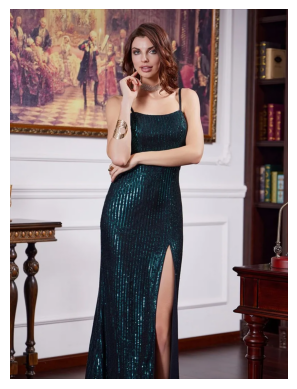

****************************************************************************************************
shopping (2).webp
16
0.5967


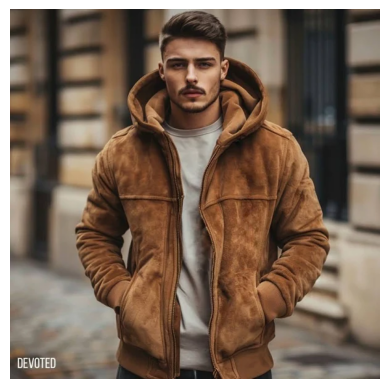

****************************************************************************************************
63c6aed159b640999e5f5ca02f451535_w1440_q90.webp
2
0.618


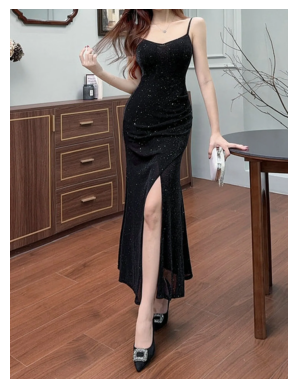

****************************************************************************************************
25ab40e0b8ac4b768fbbe84685a70902_w1440_q90.webp
17
0.638


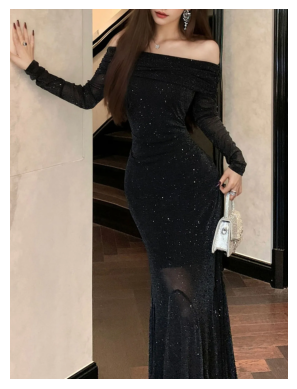

****************************************************************************************************
8fe7ed23a91b41608a8d79353cb9f7f6_w1440_q90.webp
14
0.6426


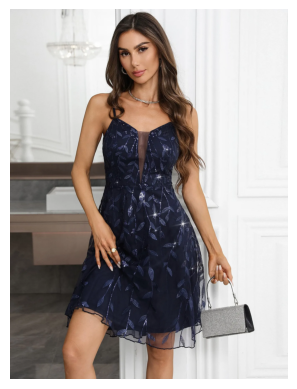

****************************************************************************************************
93c4eab1c0ff444eb0f26232cf563207_w1440_q90.webp
8
0.6523


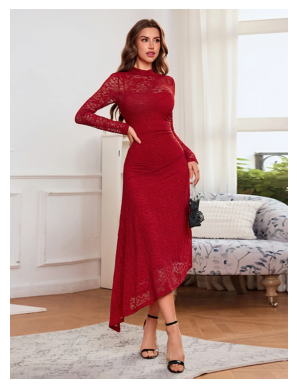

****************************************************************************************************
shopping.webp
5
0.674


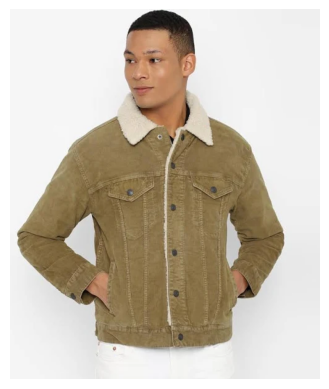

****************************************************************************************************
4d5c2747e06f4dd1b16ef4aa2eddf74f_w1440_q90.webp
12
0.682


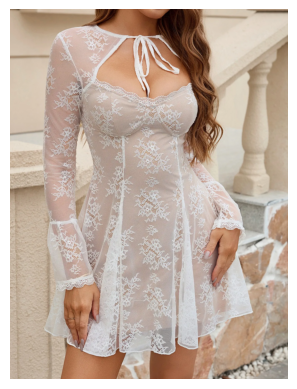

****************************************************************************************************
2f96f48099574d2ba127ad0853a7a7aa_w1440_q90.webp
1
0.6855


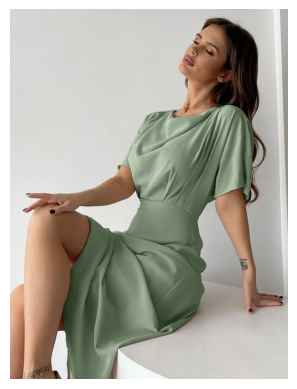

****************************************************************************************************
9ccaff8516b54973977bcfae15b1f4f1_w1440_q90.webp
6
0.6865


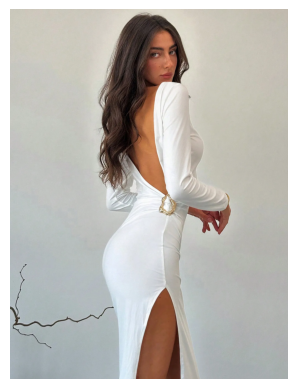

****************************************************************************************************
7f152440b3f14094863062e6496fffdb_w1440_q90.webp
4
0.711


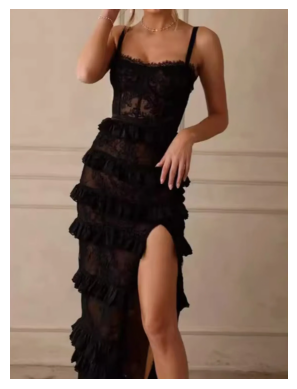

****************************************************************************************************
shopping (1).webp
13
0.7275


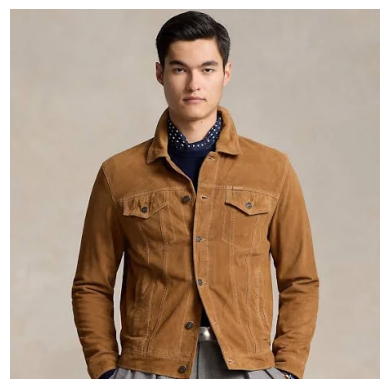

****************************************************************************************************
4f32c371ef744250af52302e340cf9ab_w1440_q90.webp
10
0.7363


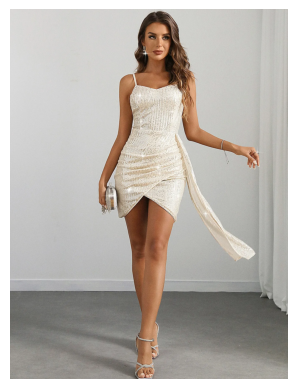

****************************************************************************************************
40c932fed45542348a75065820e76eca_w1440_q90.webp
9
0.7725


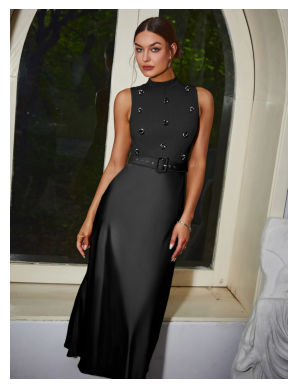

****************************************************************************************************
059d91c409724762849231cd96741114_w1440_q90.webp
0
0.824


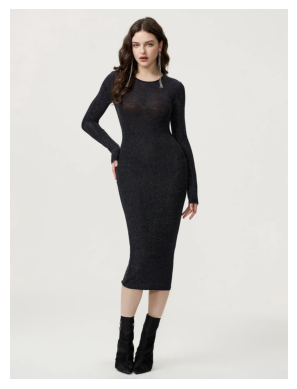

****************************************************************************************************


In [43]:
rt = sort_dicts_by_similarity(test_vector_1_blip, embeddings_list_blip)

for item in rt:
    print("=="*50)
    print(item['file_name'])
    print(item['index'])
    print(item['cosine_similarity'])
    img = mpimg.imread(os.path.join('images', item['file_name']))

    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Optional: to hide axes
    plt.show()
    print("**"*50)

shopping (2).webp
16
0.47306132


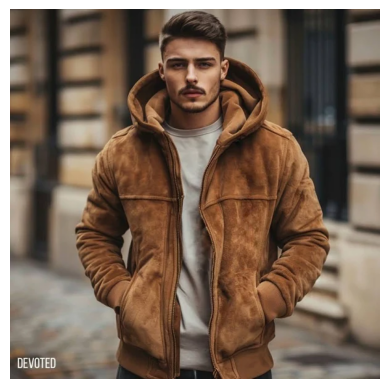

****************************************************************************************************
25ab40e0b8ac4b768fbbe84685a70902_w1440_q90.webp
17
0.533911


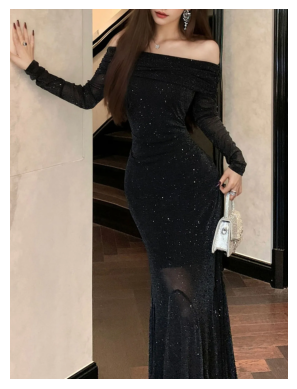

****************************************************************************************************
3e3172a74ebd4d43a4a4337bd7dff735UR_w1440_q90.webp
18
0.55708593


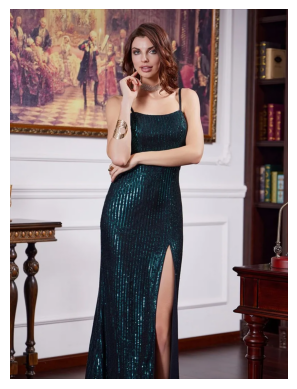

****************************************************************************************************
shopping (1).webp
13
0.57796246


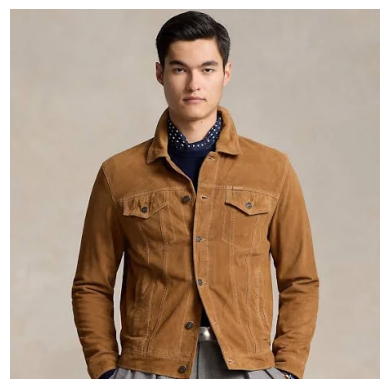

****************************************************************************************************
6ec116ad3d91468495c7b05208603c83_w1440_q90.webp
7
0.6063001


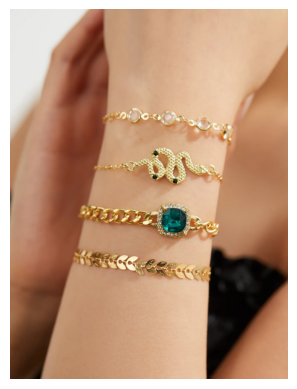

****************************************************************************************************
93c4eab1c0ff444eb0f26232cf563207_w1440_q90.webp
8
0.6073572


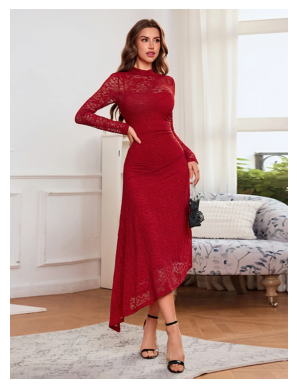

****************************************************************************************************
4d5c2747e06f4dd1b16ef4aa2eddf74f_w1440_q90.webp
12
0.61146045


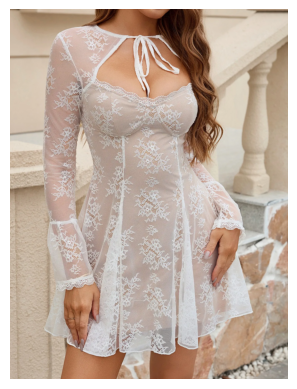

****************************************************************************************************
9ccaff8516b54973977bcfae15b1f4f1_w1440_q90.webp
6
0.6136767


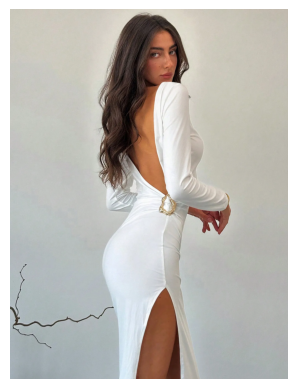

****************************************************************************************************
4f32c371ef744250af52302e340cf9ab_w1440_q90.webp
10
0.6150719


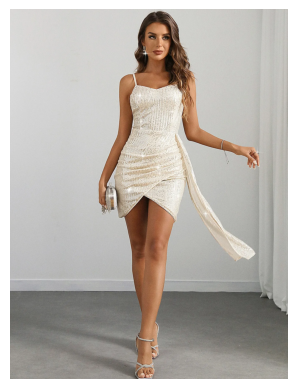

****************************************************************************************************
40c932fed45542348a75065820e76eca_w1440_q90.webp
9
0.6195756


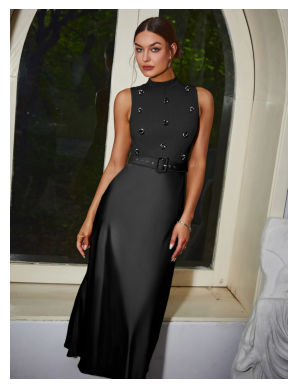

****************************************************************************************************
63c6aed159b640999e5f5ca02f451535_w1440_q90.webp
2
0.62540096


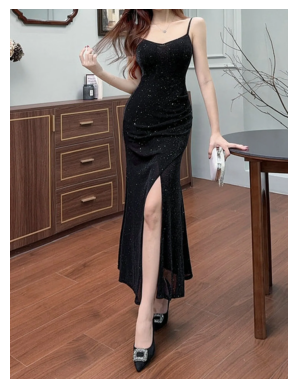

****************************************************************************************************
8d7e05fe131b43169c7ca0301e9cde4c_w1440_q90.webp
15
0.6334833


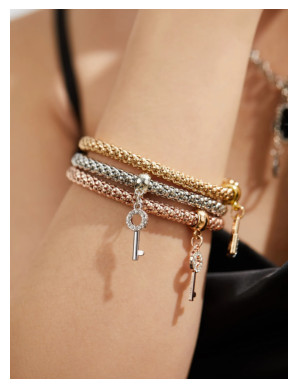

****************************************************************************************************
8fe7ed23a91b41608a8d79353cb9f7f6_w1440_q90.webp
14
0.6420059


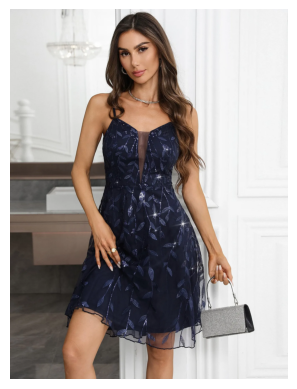

****************************************************************************************************
2f96f48099574d2ba127ad0853a7a7aa_w1440_q90.webp
1
0.65123856


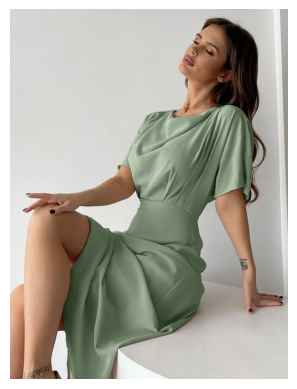

****************************************************************************************************
7f152440b3f14094863062e6496fffdb_w1440_q90.webp
4
0.69570404


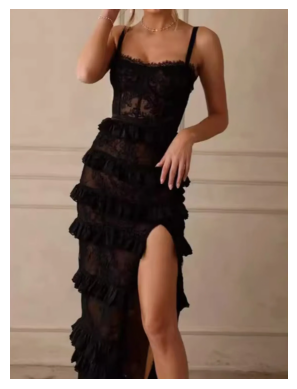

****************************************************************************************************
shopping.webp
5
0.69930583


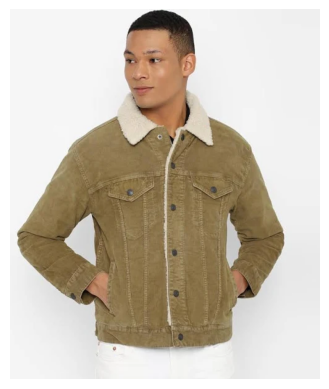

****************************************************************************************************
059d91c409724762849231cd96741114_w1440_q90.webp
0
0.76437455


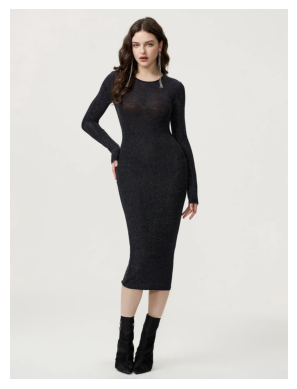

****************************************************************************************************


In [44]:
rt = sort_dicts_by_similarity(test_vector_1_clip, embeddings_list_clip)

for item in rt:
    print("=="*50)
    print(item['file_name'])
    print(item['index'])
    print(item['cosine_similarity'])
    img = mpimg.imread(os.path.join('images', item['file_name']))

    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Optional: to hide axes
    plt.show()
    print("**"*50)

8d7e05fe131b43169c7ca0301e9cde4c_w1440_q90.webp
15
0.4596571


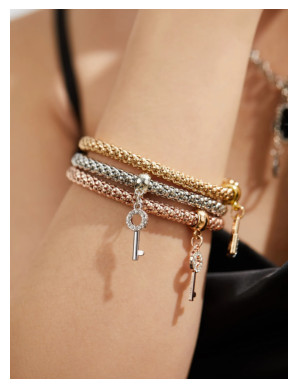

****************************************************************************************************
6ec116ad3d91468495c7b05208603c83_w1440_q90.webp
7
0.46155423


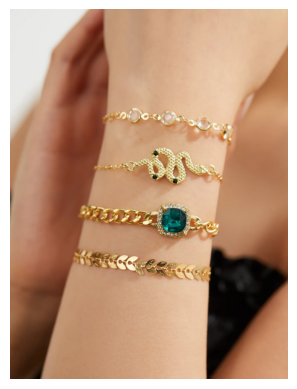

****************************************************************************************************
shopping (1).webp
13
0.47630733


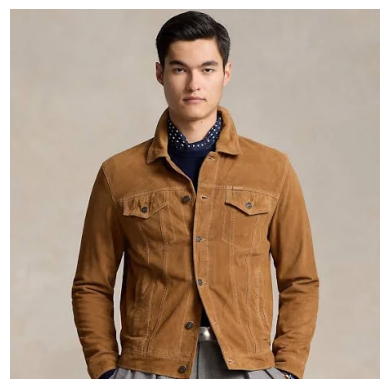

****************************************************************************************************
shopping (2).webp
16
0.48287517


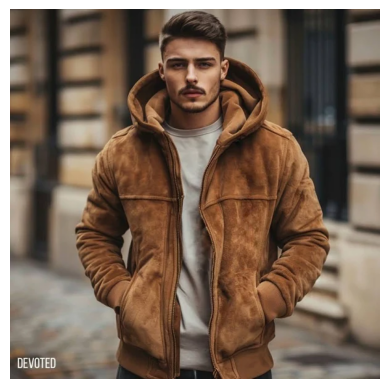

****************************************************************************************************
4d5c2747e06f4dd1b16ef4aa2eddf74f_w1440_q90.webp
12
0.501598


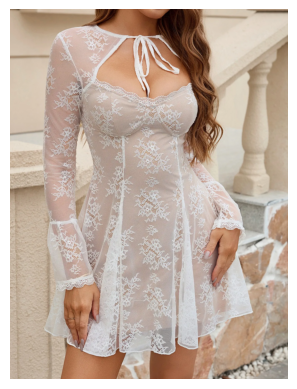

****************************************************************************************************
3e3172a74ebd4d43a4a4337bd7dff735UR_w1440_q90.webp
18
0.5404142


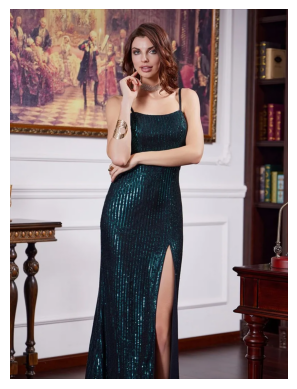

****************************************************************************************************
7f152440b3f14094863062e6496fffdb_w1440_q90.webp
4
0.54572624


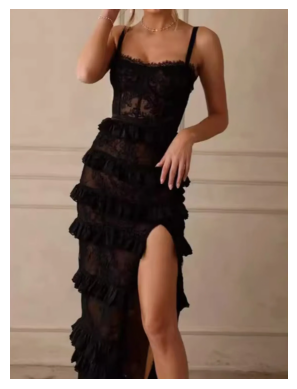

****************************************************************************************************
93c4eab1c0ff444eb0f26232cf563207_w1440_q90.webp
8
0.54870135


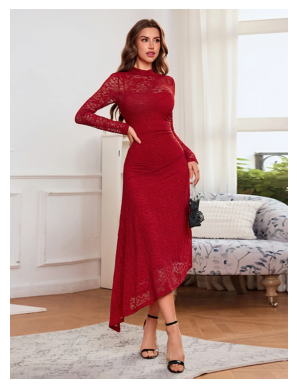

****************************************************************************************************
9ccaff8516b54973977bcfae15b1f4f1_w1440_q90.webp
6
0.56744754


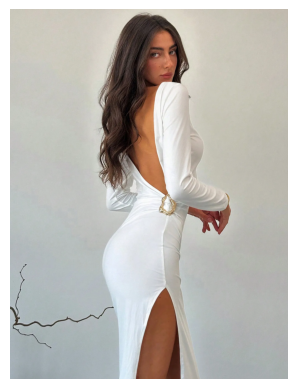

****************************************************************************************************
4f32c371ef744250af52302e340cf9ab_w1440_q90.webp
10
0.5768236


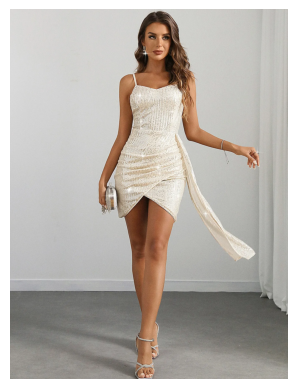

****************************************************************************************************
8fe7ed23a91b41608a8d79353cb9f7f6_w1440_q90.webp
14
0.5774646


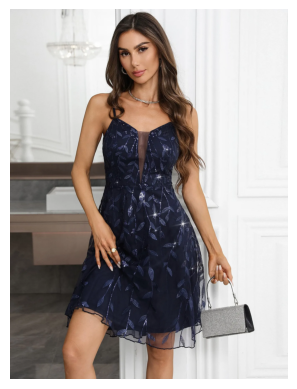

****************************************************************************************************
2f96f48099574d2ba127ad0853a7a7aa_w1440_q90.webp
1
0.58062816


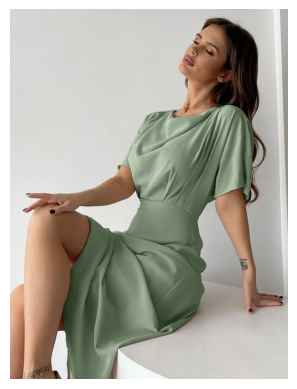

****************************************************************************************************
63c6aed159b640999e5f5ca02f451535_w1440_q90.webp
2
0.58538026


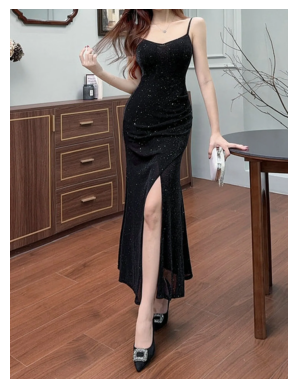

****************************************************************************************************
25ab40e0b8ac4b768fbbe84685a70902_w1440_q90.webp
17
0.5942603


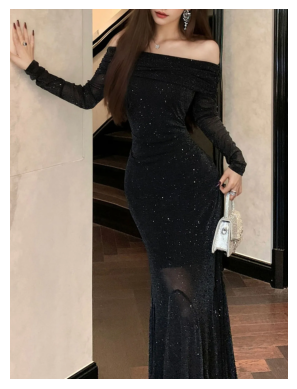

****************************************************************************************************
shopping.webp
5
0.5956251


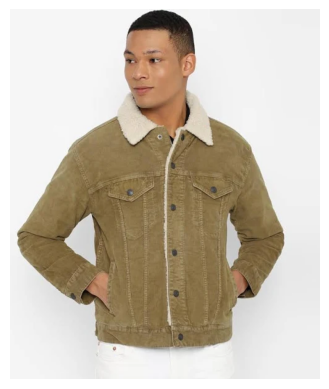

****************************************************************************************************
059d91c409724762849231cd96741114_w1440_q90.webp
0
0.608691


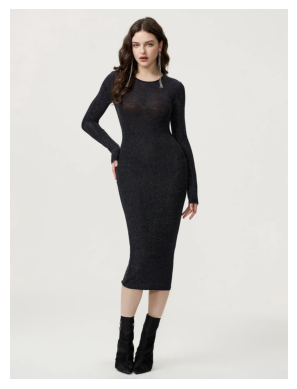

****************************************************************************************************
40c932fed45542348a75065820e76eca_w1440_q90.webp
9
0.65273523


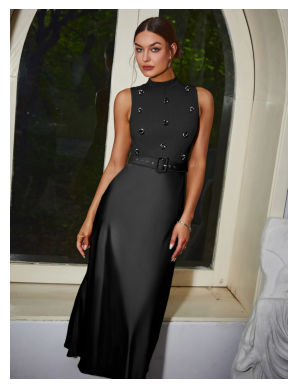

****************************************************************************************************


In [45]:
rt = sort_dicts_by_similarity(test_vector_1_vgg, embeddings_list_vgg)

for item in rt:
    print("=="*50)
    print(item['file_name'])
    print(item['index'])
    print(item['cosine_similarity'])
    img = mpimg.imread(os.path.join('images', item['file_name']))

    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Optional: to hide axes
    plt.show()
    print("**"*50)

shopping (1).webp
13
-0.07367154


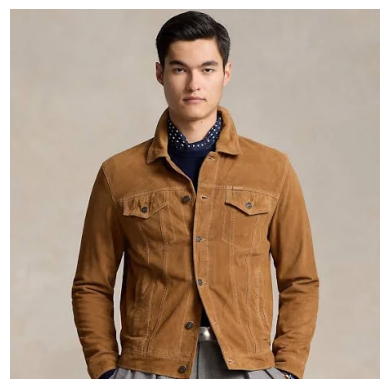

****************************************************************************************************
shopping.webp
5
-0.06664744


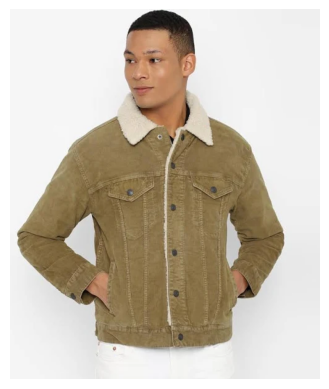

****************************************************************************************************
shopping (2).webp
16
-0.03648368


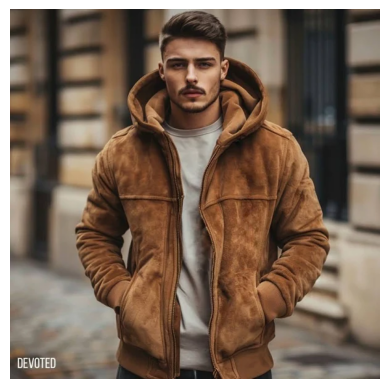

****************************************************************************************************
6ec116ad3d91468495c7b05208603c83_w1440_q90.webp
7
-0.016051795


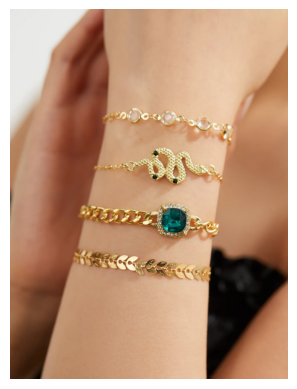

****************************************************************************************************
8d7e05fe131b43169c7ca0301e9cde4c_w1440_q90.webp
15
-0.0098812645


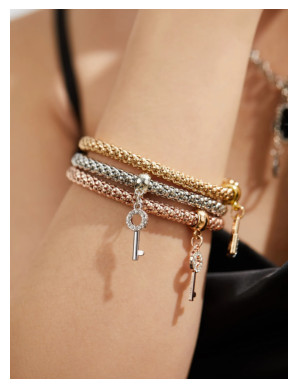

****************************************************************************************************
4d5c2747e06f4dd1b16ef4aa2eddf74f_w1440_q90.webp
12
0.08230026


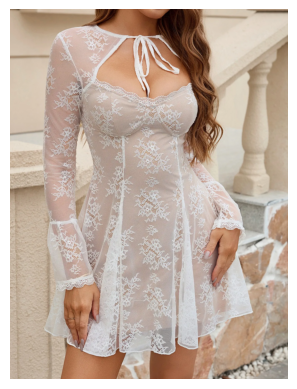

****************************************************************************************************
9ccaff8516b54973977bcfae15b1f4f1_w1440_q90.webp
6
0.08824026


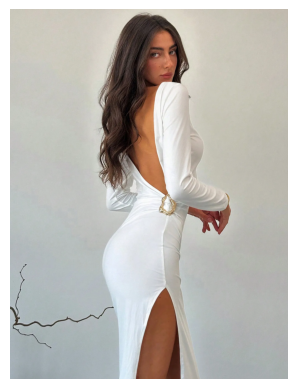

****************************************************************************************************
4f32c371ef744250af52302e340cf9ab_w1440_q90.webp
10
0.13658261


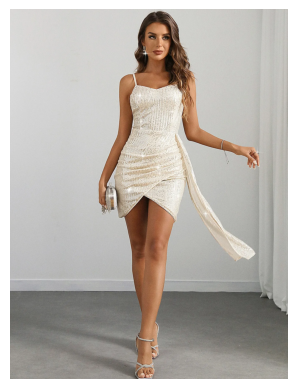

****************************************************************************************************
40c932fed45542348a75065820e76eca_w1440_q90.webp
9
0.14062054


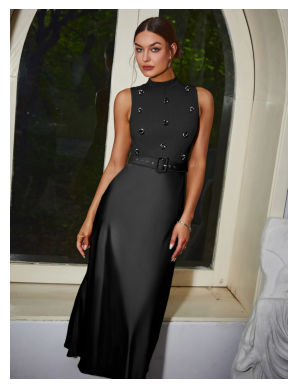

****************************************************************************************************
3e3172a74ebd4d43a4a4337bd7dff735UR_w1440_q90.webp
18
0.14823362


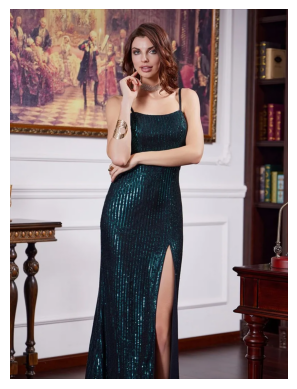

****************************************************************************************************
8fe7ed23a91b41608a8d79353cb9f7f6_w1440_q90.webp
14
0.15081872


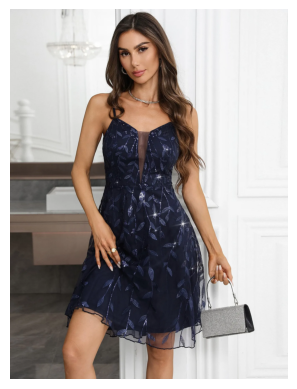

****************************************************************************************************
93c4eab1c0ff444eb0f26232cf563207_w1440_q90.webp
8
0.15269175


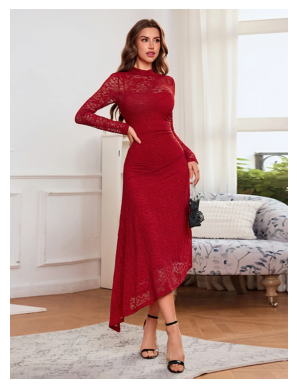

****************************************************************************************************
2f96f48099574d2ba127ad0853a7a7aa_w1440_q90.webp
1
0.15353498


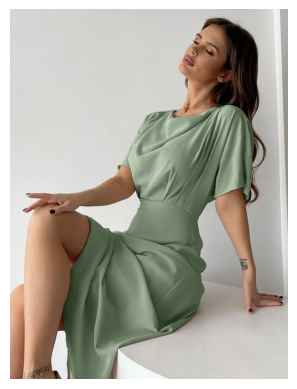

****************************************************************************************************
059d91c409724762849231cd96741114_w1440_q90.webp
0
0.16031468


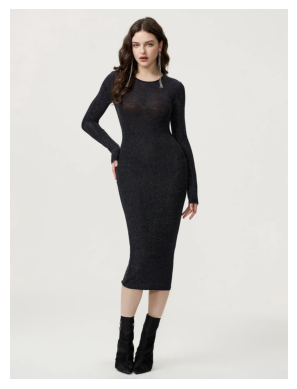

****************************************************************************************************
63c6aed159b640999e5f5ca02f451535_w1440_q90.webp
2
0.16597335


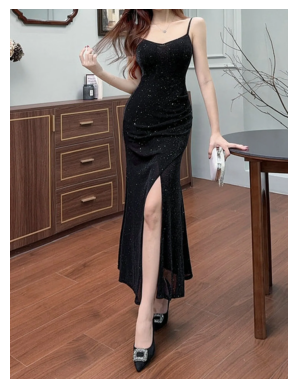

****************************************************************************************************
7f152440b3f14094863062e6496fffdb_w1440_q90.webp
4
0.16967438


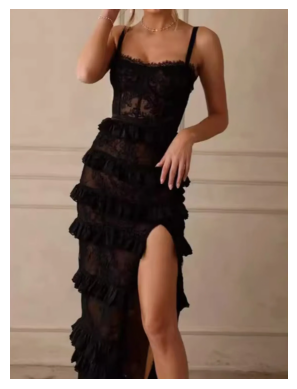

****************************************************************************************************
25ab40e0b8ac4b768fbbe84685a70902_w1440_q90.webp
17
0.19254434


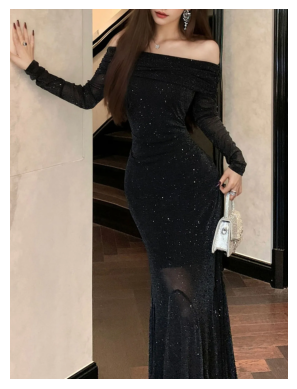

****************************************************************************************************


In [41]:
rt = sort_dicts_by_similarity(test_vector_1_dino, embeddings_list_dino)

for item in rt:
    print("=="*50)
    print(item['file_name'])
    print(item['index'])
    print(item['cosine_similarity'])
    # Read image using matplotlib
    img = mpimg.imread(os.path.join('images', item['file_name']))

    # Display the image
    plt.imshow(img)
    plt.axis('off')  # Optional: to hide axes
    plt.show()
    print("**"*50)

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load the image from a file (replace with your image file path)
image_path = 'path_to_your_image.jpg'

# Read image using matplotlib
img = mpimg.imread(image_path)

# Display the image
plt.imshow(img)
plt.axis('off')  # Optional: to hide axes
plt.show()


In [47]:
import pickle

pickle.dump(embeddings_list_blip, open('pickle_files/embeddings_list_blip.pkl', 'wb'))
pickle.dump(embeddings_list_clip, open('pickle_files/embeddings_list_clip.pkl', 'wb'))
pickle.dump(embeddings_list_dino, open('pickle_files/embeddings_list_dino.pkl', 'wb'))
pickle.dump(embeddings_list_efficientNet, open('pickle_files/embeddings_list_efficientNet.pkl', 'wb'))
pickle.dump(embeddings_list_vgg, open('pickle_files/embeddings_list_vgg.pkl', 'wb'))
pickle.dump(embeddings_list_vit, open('pickle_files/embeddings_list_vit.pkl', 'wb'))